In [12]:
from ultralytics import YOLOWorld
from PIL import Image
import matplotlib.pyplot as plt
import os
import pandas as pd

In [13]:
model = YOLOWorld('yolov8s-worldv2.pt')

In [3]:
train_df = pd.read_csv('./G340890_50m_panoid.csv')

In [28]:
train_df

,panoid,lat,lon,var1,heading,var3,var4,year,month
0,004g0nBjiAoWzLLLCT252A,40.862831,-73.907227,33.506706,271.509120,88.789510,1.265002,2022,11
1,004WOqNXaDG1GWxw1aq0kA,40.880501,-73.900636,7.838017,24.733295,90.740005,0.193049,2019,8
2,005FEssqWDoX8qyMsk-7ig,40.854582,-73.854778,30.942800,149.051450,88.802890,1.954567,2015,10
3,005Gu_dGcXTN_PuTJgNAuw,40.899717,-73.843935,36.128685,71.163790,94.162575,359.729920,2018,9
4,005NcqQBhcNxQxN57-zbjQ,40.778504,-73.925649,47.360750,329.386470,91.243830,359.905270,2011,9
...,...,...,...,...,...,...,...,...,...
341848,ZzZOHUzJ5GU8QpQXNpMElA,40.814607,-73.926367,3.481557,299.488500,89.482290,0.835001,2022,10
341849,ZZzsNFVbkbO66_wiCP4dcg,40.817899,-73.916987,12.972485,200.212940,91.807170,1.023868,2017,10
341850,zZzsPdZ9PjRdLSjGvnxYNA,40.850479,-73.883429,25.637087,110.750470,89.122990,357.758760,2017,10
341851,zZZT2DAeoaAGtijlNHq2nQ,40.831027,-73.832043,5.560051,230.695860,90.181076,358.741300,2021,9


In [4]:
import osmnx as ox

# Define the bounding box or location
place_name = "New York City, USA"  # Example area
tags = {'amenity': ['post_box', 'bench', 'fast_food', 'waste_basket']}  # Fetch all amenities

# Fetch amenities in the defined area
gdf = ox.features_from_place(place_name, tags)

# Extract latitude and longitude from the geometries
gdf['latitude'] = gdf.geometry.centroid.y
gdf['longitude'] = gdf.geometry.centroid.x

# Filter for relevant columns
amenities_lat_lon_df = gdf[['amenity', 'latitude', 'longitude']]

# Display the DataFrame
print(amenities_lat_lon_df)

                            amenity   latitude  longitude
element id                                               
node    42538083              bench  40.673352 -73.970702
        357588583   bicycle_parking  40.661771 -73.992858
        357618584          post_box  40.682496 -73.962688
        357618608          post_box  40.643833 -73.979460
        357625090   bicycle_parking  40.688405 -73.965733
...                             ...        ...        ...
way     1319909118            bench  40.720378 -74.010841
        1319909119            bench  40.720343 -74.010985
        1319909120            bench  40.720334 -74.010894
        1319909121            bench  40.720327 -74.010823
        1342240422  bicycle_parking  40.723798 -74.007727

[32226 rows x 3 columns]


/tmp/ipykernel_3849571/1566055639.py:11: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf['latitude'] = gdf.geometry.centroid.y
/tmp/ipykernel_3849571/1566055639.py:12: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf['longitude'] = gdf.geometry.centroid.x


In [5]:
import pandas as pd
from geopy.distance import geodesic
import math

result_list = []

# Define approximate degree deltas for ~30 meters:
# Latitude: ~111 km per degree, so 30 m ~ 0.00027 degrees
lat_delta = 0.0003  # A slightly larger buffer than 0.00027 for safety

# We'll dynamically compute longitude delta to be safe:
# longitude degrees change with latitude, so we compute for each point.
def get_lon_delta(lat):
    return 0.0003 / math.cos(math.radians(lat))

for index, row in train_df.iterrows():
    pic_lat = row['lat']
    pic_lon = row['lon']

    # Compute bounding box around the picture
    lon_delta = get_lon_delta(pic_lat)
    lat_min = pic_lat - lat_delta
    lat_max = pic_lat + lat_delta
    lon_min = pic_lon - lon_delta
    lon_max = pic_lon + lon_delta

    # Filter amenities by bounding box
    subset = amenities_lat_lon_df[
        (amenities_lat_lon_df['latitude'] >= lat_min) &
        (amenities_lat_lon_df['latitude'] <= lat_max) &
        (amenities_lat_lon_df['longitude'] >= lon_min) &
        (amenities_lat_lon_df['longitude'] <= lon_max)
    ]
    
    # Now compute geodesic distance on this filtered subset
    pic_coords = (pic_lat, pic_lon)
    amenities_in_radius = []
    for _, amenity_row in subset.iterrows():
        amenity_coords = (amenity_row['latitude'], amenity_row['longitude'])
        dist = geodesic(pic_coords, amenity_coords).meters
        if dist <= 30:
            amenities_in_radius.append({
                'amenity': amenity_row['amenity'],
                'latitude': amenity_row['latitude'],
                'longitude': amenity_row['longitude']
            })
    if amenities_in_radius:
        result_list.append({
            'id': row['panoid'],
            'latitude': pic_lat,
            'longitude': pic_lon,
            'amenities': amenities_in_radius
        })

final_df = pd.DataFrame(result_list)
print(final_df)


                           id   latitude  longitude  \
0      014oZNx-zknPFsUgAuuQKA  40.860877 -73.902415   
1      01B1pSm5cydE2_oP-X2-Zg  40.819418 -73.864414   
2      01Iomneot1J3cXx40bl6Vg  40.848541 -73.861590   
3      01IQ2VwAsaag8NgJWJAApg  40.844974 -73.845636   
4      01Jh7BySlPc3HiOLbJ3EKw  40.837505 -73.889539   
...                       ...        ...        ...   
10892  _zzw2JXZUXngKzwjbb3vQw  40.817238 -73.922282   
10893  zZxGvpAG-ZwisDJdU2lB7w  40.901825 -73.901800   
10894  Zzzd7SlkckA2OBiXjWoODw  40.904114 -73.904754   
10895  ZZzsNFVbkbO66_wiCP4dcg  40.817899 -73.916987   
10896  zzZWC00CmqJRK_hJj9UX7g  40.843283 -73.870002   

                                               amenities  
0      [{'amenity': 'bicycle_parking', 'latitude': 40...  
1      [{'amenity': 'bicycle_parking', 'latitude': 40...  
2      [{'amenity': 'post_box', 'latitude': 40.848399...  
3      [{'amenity': 'bicycle_parking', 'latitude': 40...  
4      [{'amenity': 'bicycle_parking', 'lati

In [6]:
from geopy.distance import geodesic
import pandas as pd

distance_results = []


for _, row in final_df.iterrows():
    # Get the ID point coordinates
    id_coords = (row['latitude'], row['longitude'])
    
    amenities_with_distances = []
    
    # iterate over the amenities for this id
    for amenity in row['amenities']:
        amenity_coords = (amenity['latitude'], amenity['longitude'])
        distance = geodesic(id_coords, amenity_coords).meters 
        
        amenities_with_distances.append({
            'amenity': amenity['amenity'],
            'latitude': amenity['latitude'],
            'longitude': amenity['longitude'],
            'distance_from_id': distance
        })
    
    distance_results.append({
        'latitude': row['latitude'],
        'longitude': row['longitude'],
        'id': row['id'],
        'amenities': amenities_with_distances
    })

final_with_distances_df = pd.DataFrame(distance_results)
print(final_with_distances_df)


        latitude  longitude                      id  \
0      40.860877 -73.902415  014oZNx-zknPFsUgAuuQKA   
1      40.819418 -73.864414  01B1pSm5cydE2_oP-X2-Zg   
2      40.848541 -73.861590  01Iomneot1J3cXx40bl6Vg   
3      40.844974 -73.845636  01IQ2VwAsaag8NgJWJAApg   
4      40.837505 -73.889539  01Jh7BySlPc3HiOLbJ3EKw   
...          ...        ...                     ...   
10892  40.817238 -73.922282  _zzw2JXZUXngKzwjbb3vQw   
10893  40.901825 -73.901800  zZxGvpAG-ZwisDJdU2lB7w   
10894  40.904114 -73.904754  Zzzd7SlkckA2OBiXjWoODw   
10895  40.817899 -73.916987  ZZzsNFVbkbO66_wiCP4dcg   
10896  40.843283 -73.870002  zzZWC00CmqJRK_hJj9UX7g   

                                               amenities  
0      [{'amenity': 'bicycle_parking', 'latitude': 40...  
1      [{'amenity': 'bicycle_parking', 'latitude': 40...  
2      [{'amenity': 'post_box', 'latitude': 40.848399...  
3      [{'amenity': 'bicycle_parking', 'latitude': 40...  
4      [{'amenity': 'bicycle_parking', 'lati

In [15]:
import os
import contextlib
import pandas as pd

base_folder = "/hpi/fs00/scratch/alexandra.kudaeva/street-view-data/output/G340890_50m"
orientations = ["front", "back", "left", "right"]

detection_results = []

for idx, row in final_with_distances_df.iterrows():
    image_id = row['id']
    
    amenities_for_this_id = list(set(a['amenity'] for a in row['amenities']))
    model.set_classes(amenities_for_this_id)

    # build subfolder path from the first three characters of image_id
    s1, s2, s3 = image_id[0], image_id[1], image_id[2]
    folder_path = os.path.join(base_folder, s1, s2, s3)
    
    for orientation in orientations:
        image_filename = f"{image_id}_{orientation}.webp"
        image_path = os.path.join(folder_path, image_filename)
        
        if not os.path.exists(image_path):
            continue
        results = model.predict(source=image_path, verbose=False)
        
        for result in results:
            # each box: [x_min, y_min, x_max, y_max, confidence, class_id]
            for box in result.boxes.data.tolist():
                cls_id = int(box[5])
                label = model.names[cls_id]
                confidence = box[4]

                if label in amenities_for_this_id:
                    detection_results.append({
                        'id': image_id,
                        'subfolder': f"{s1}/{s2}/{s3}",
                        'orientation': orientation,
                        'label': label,
                        'confidence': confidence,
                        'x_min': box[0],
                        'y_min': box[1],
                        'x_max': box[2],
                        'y_max': box[3]
                    })

detection_df = pd.DataFrame(detection_results)
print(detection_df)


                          id subfolder orientation            label  \
0     014oZNx-zknPFsUgAuuQKA     0/1/4        back  bicycle_parking   
1     014oZNx-zknPFsUgAuuQKA     0/1/4        left  bicycle_parking   
2     014oZNx-zknPFsUgAuuQKA     0/1/4        left  bicycle_parking   
3     01B1pSm5cydE2_oP-X2-Zg     0/1/B       front  bicycle_parking   
4     01B1pSm5cydE2_oP-X2-Zg     0/1/B       front  bicycle_parking   
...                      ...       ...         ...              ...   
4737  -zXBtvtsFTpLm1jN2KaG8A     -/z/X        left  bicycle_parking   
4738  -zXBtvtsFTpLm1jN2KaG8A     -/z/X        left  bicycle_parking   
4739  -zXBtvtsFTpLm1jN2KaG8A     -/z/X        left  bicycle_parking   
4740  -zXBtvtsFTpLm1jN2KaG8A     -/z/X       right  bicycle_parking   
4741  -zXBtvtsFTpLm1jN2KaG8A     -/z/X       right  bicycle_parking   

      confidence       x_min       y_min       x_max       y_max  
0       0.319774  121.360275  398.646515  134.662155  434.286896  
1       0.764

In [26]:
filtered_df = detection_df[detection_df["confidence"] > 0.75]

In [23]:
#filtered_df = detection_df[detection_df["label"] != "bicycle_parking"]

In [27]:
filtered_df

,id,subfolder,orientation,label,confidence,x_min,y_min,x_max,y_max,image_path
1,014oZNx-zknPFsUgAuuQKA,0/1/4,left,bicycle_parking,0.764597,601.987366,418.946472,618.124390,465.269135,/hpi/fs00/scratch/alexandra.kudaeva/street-vie...
8,01y_g5yLaXsM4oSV_xxMRA,0/1/y,left,bicycle_parking,0.930973,297.764465,415.494293,324.693237,444.620087,/hpi/fs00/scratch/alexandra.kudaeva/street-vie...
11,02R4NApdqGF40vkBwRToQQ,0/2/R,front,bicycle_parking,0.827832,475.275299,439.665100,500.130341,477.072968,/hpi/fs00/scratch/alexandra.kudaeva/street-vie...
25,050fb68N6C2jDEkaS6isIQ,0/5/0,front,bicycle_parking,0.768513,673.334351,414.991425,721.483337,442.654419,/hpi/fs00/scratch/alexandra.kudaeva/street-vie...
27,050fb68N6C2jDEkaS6isIQ,0/5/0,back,bicycle_parking,0.955500,103.168930,431.606201,116.258705,458.495148,/hpi/fs00/scratch/alexandra.kudaeva/street-vie...
...,...,...,...,...,...,...,...,...,...,...
4696,-VQjax4N1BEJnRATLhNllw,-/V/Q,back,bicycle_parking,0.907299,59.944412,446.107971,81.925987,481.070129,/hpi/fs00/scratch/alexandra.kudaeva/street-vie...
4704,-wfjnkAOo30RcDQilRIPDA,-/w/f,back,bicycle_parking,0.924268,150.996399,429.328735,183.732788,453.107697,/hpi/fs00/scratch/alexandra.kudaeva/street-vie...
4728,-YQIAn7o_FZxA0NTtJEZYA,-/Y/Q,right,bicycle_parking,0.950481,30.502800,424.454651,62.138206,446.528076,/hpi/fs00/scratch/alexandra.kudaeva/street-vie...
4729,-YQIAn7o_FZxA0NTtJEZYA,-/Y/Q,right,bicycle_parking,0.892555,44.263203,405.381927,63.021519,445.435822,/hpi/fs00/scratch/alexandra.kudaeva/street-vie...


In [ ]:
## Print examples

/tmp/ipykernel_3849571/660815530.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['image_path'] = filtered_df.apply(get_image_path, axis=1)


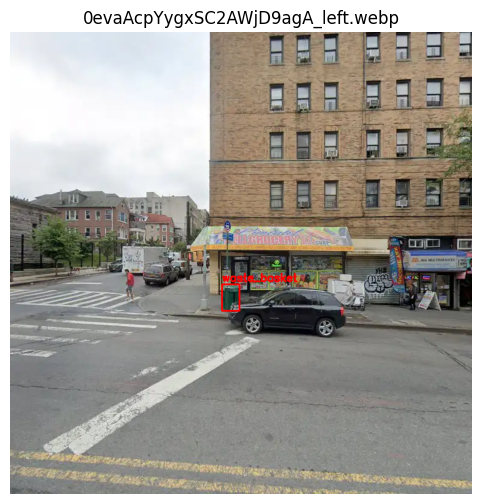

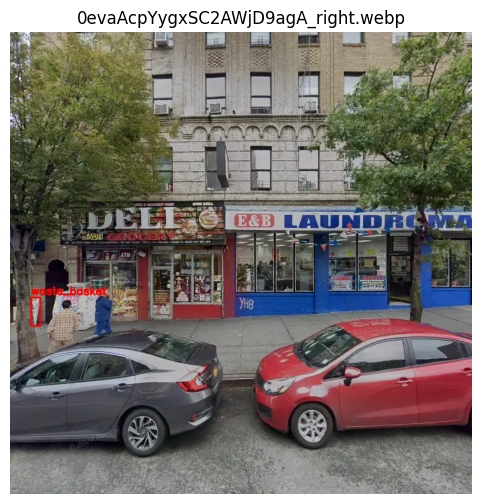

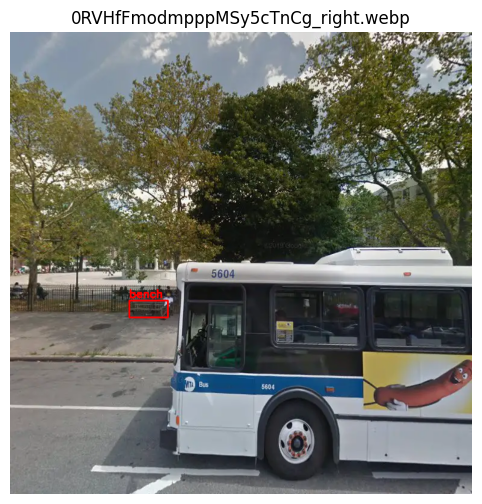

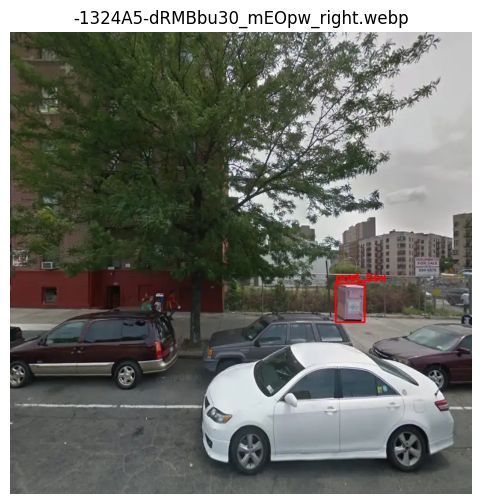

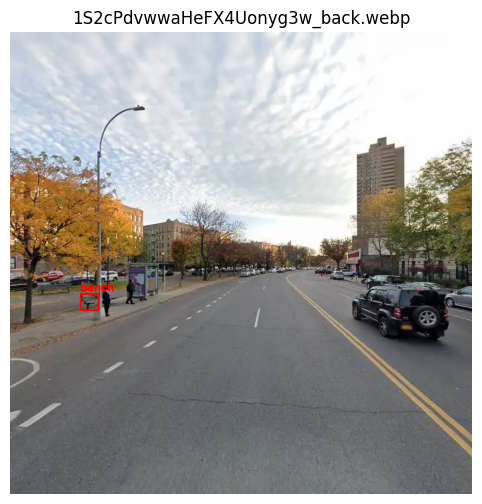

...

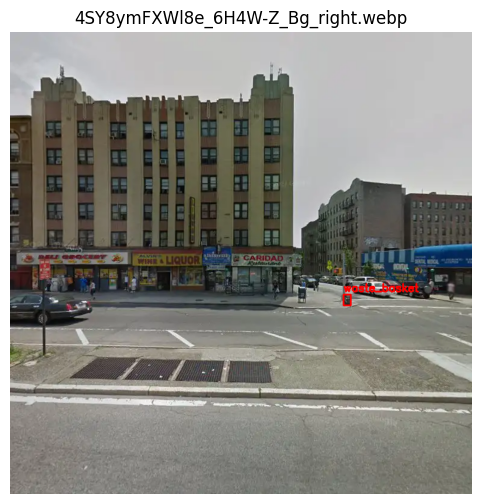

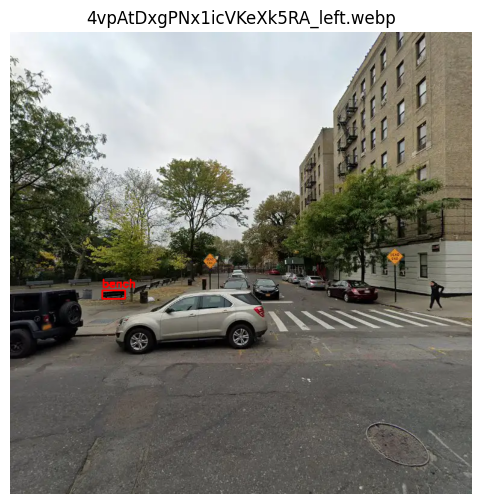

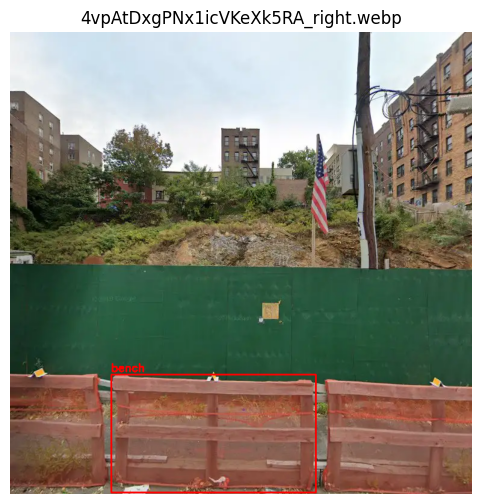

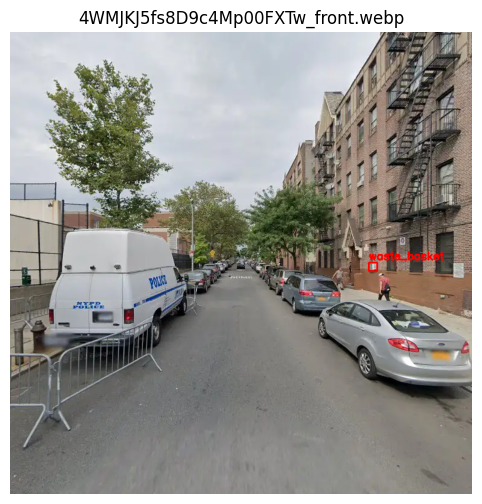

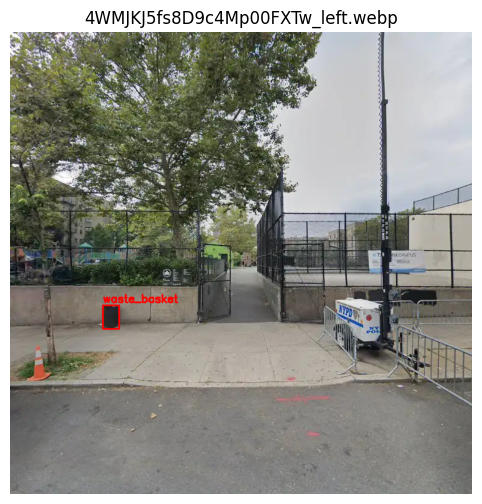

In [25]:
import os
import cv2
import matplotlib.pyplot as plt

def plot_image_with_boxes(image_path, boxes, labels, output_size=(10, 6)):
    """
    Loads an image from `image_path`, draws bounding boxes and labels from `boxes` and `labels`,
    then displays it using matplotlib.
    
    :param image_path: path to the image file
    :param boxes: list of bounding boxes, each a tuple/list [x_min, y_min, x_max, y_max]
    :param labels: list of labels for each bounding box
    :param output_size: (width, height) figure size for matplotlib
    """
    
    img_bgr = cv2.imread(image_path)
    if img_bgr is None:
        print(f"Could not load image from {image_path}")
        return
    
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    
    for (box, label) in zip(boxes, labels):
        x_min, y_min, x_max, y_max = box
        # Convert to integers
        x_min, y_min, x_max, y_max = int(x_min), int(y_min), int(x_max), int(y_max)
        
        cv2.rectangle(img_rgb, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
        # Put label text above the top-left corner of the box
        cv2.putText(
            img_rgb, 
            str(label), 
            (x_min, max(y_min - 5, 0)), 
            cv2.FONT_HERSHEY_SIMPLEX, 
            0.6, 
            (255, 0, 0), 
            2
        )
    
    plt.figure(figsize=output_size)
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.title(os.path.basename(image_path))
    plt.show()

base_folder = "/hpi/fs00/scratch/alexandra.kudaeva/street-view-data/output/G340890_50m"


def get_image_path(row):
    image_id = row['id']
    subfolder = row['subfolder']
    orientation = row['orientation']
    return os.path.join(base_folder, subfolder, f"{image_id}_{orientation}.webp")

filtered_df['image_path'] = filtered_df.apply(get_image_path, axis=1)

grouped = filtered_df.groupby('image_path')
# get first 30 or so
unique_paths = filtered_df['image_path'].unique()[:30]

for path in unique_paths:
    rows_for_this_image = grouped.get_group(path)
    
    boxes = rows_for_this_image[['x_min','y_min','x_max','y_max']].values.tolist()
    labels = rows_for_this_image['label'].tolist()
    
    plot_image_with_boxes(path, boxes, labels)
